In [1]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../python')
from functions import *
from models import *
from tqdm import *
import os

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import corner

from sklearn.preprocessing import StandardScaler




# Set up some parameters for pretty plots
plt.rcParams.update({
    'figure.dpi': 200,
    "text.usetex": True,
    "pgf.rcfonts": False,
    "font.family": "serif",
    "font.size": 13,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 11,
    "figure.max_open_warning": False,
})


2023-09-01 15:32:38.260191: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Finding the right parameter for side-band

In [2]:
# Load calssified data
class_df = pd.read_hdf('../notebooks/test_gd1/df_test.h5')

interest_vars=['ϕ', 'λ', 'μ_ϕcosλ', 'μ_λ', 'b-r', 'g']  # all trainable params
intuitive_vars=['ϕ', 'λ']                               # Stream looks clean on those vars
toy_vars=['ϕ', 'λ', 'μ_λ']                              # Toy problem
stream_inds=class_df['stream']                          # 'Ground Truth'
nn_score_inds=class_df['nn_score']>0.7                  # 80% of NN score



# Centering around entire data

### Simplified 2D example

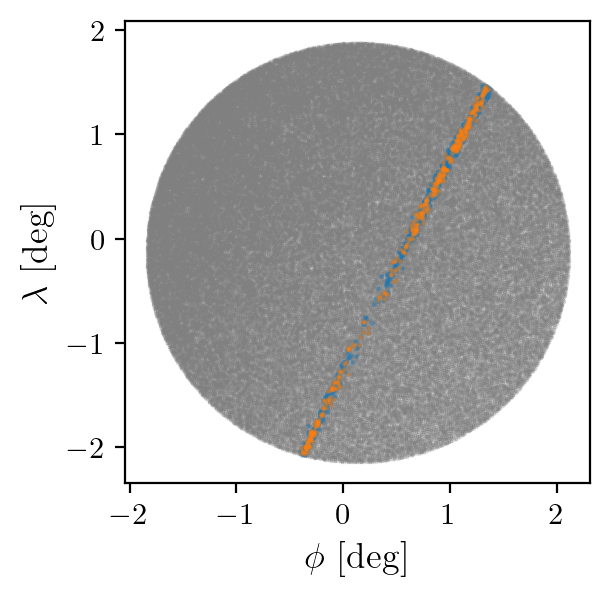

In [91]:
# Stadardaize data
scaler = StandardScaler()
standardized_design = scaler.fit_transform(class_df[intuitive_vars])

# Plot labeled vs ground truth
plt.figure(figsize=(3,3))
plt.scatter(*standardized_design.T,c='gray',alpha=0.2,s=0.03)
plt.scatter(*standardized_design[stream_inds].T,alpha=0.4,s=0.6)
plt.scatter(*standardized_design[nn_score_inds].T,alpha=0.4,s=0.6)
plt.xlabel('$\phi$ [deg]')
plt.ylabel('$\lambda$ [deg]')
plt.show()

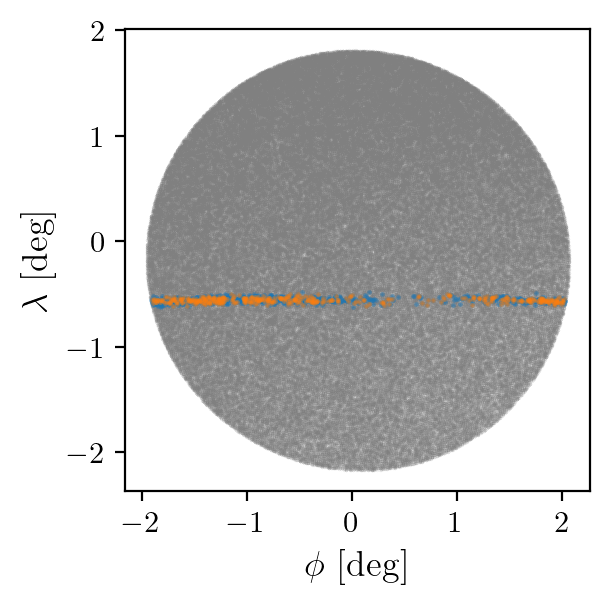

In [92]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]


plt.figure(figsize=(3,3))
plt.scatter(*sorted_eigenvectors_nn @ standardized_design.T,c='gray',alpha=0.2,s=0.03)
plt.scatter(*sorted_eigenvectors_nn @ standardized_design[stream_inds].T,alpha=0.4,s=0.6)
plt.scatter(*sorted_eigenvectors_nn @ standardized_design[nn_score_inds].T,alpha=0.4,s=0.6)
plt.xlabel('$\phi$ [deg]')
plt.ylabel('$\lambda$ [deg]')
plt.show()

### 3D Case

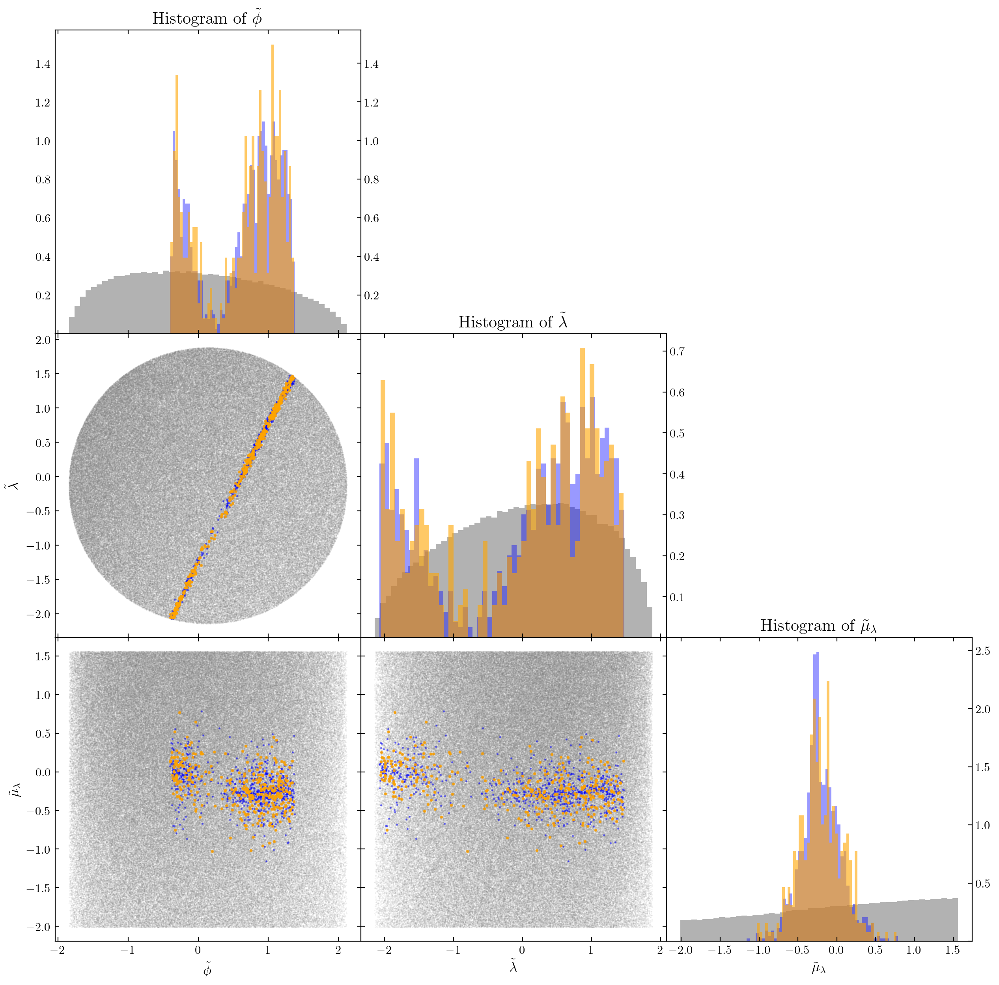

In [5]:
# Stadardaize data
scaler = StandardScaler()
standardized_design = scaler.fit_transform(class_df[toy_vars])

vars=[r'$\tilde{\phi}$', r'$\tilde{\lambda}$', r'$\tilde{\mu}_\lambda$']
corner_plots(standardized_design, vars, nn_score_inds, stream_inds)

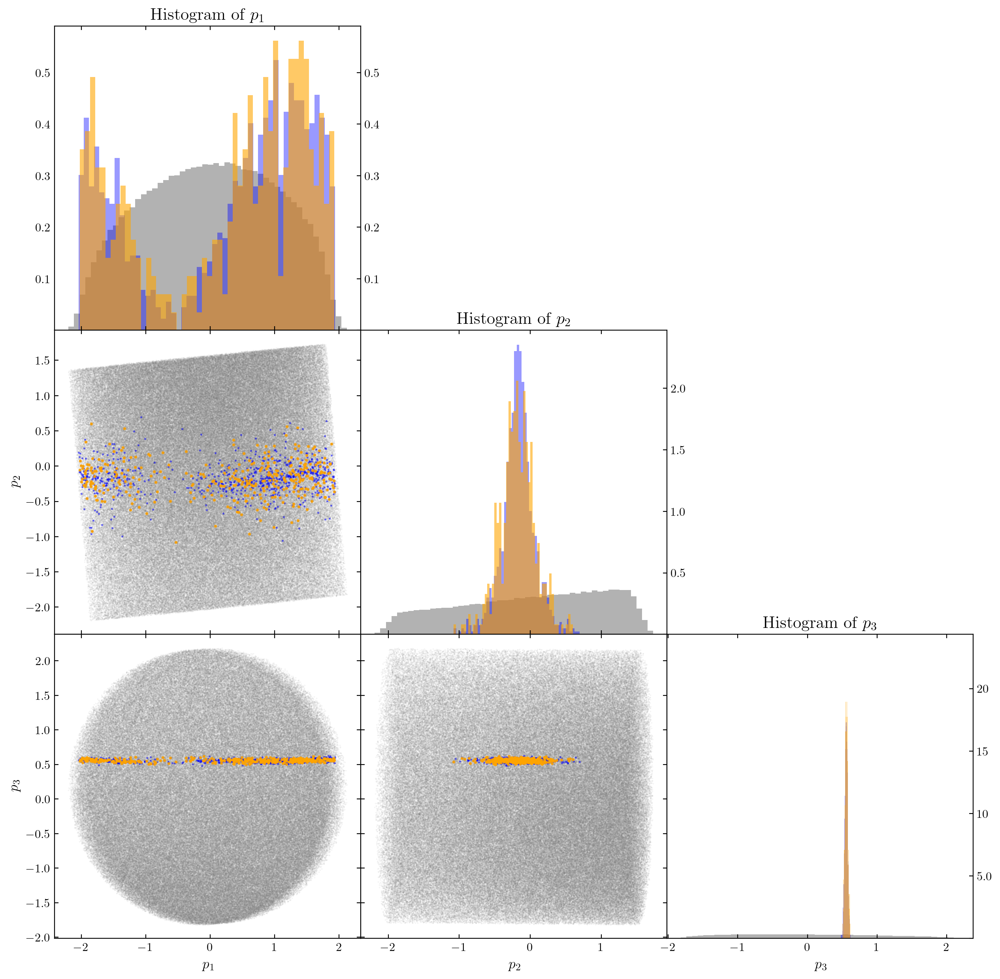

In [7]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]

vars=['$p_1$', '$p_2$', '$p_3$']
corner_plots(standardized_design @ sorted_eigenvectors_nn, vars, nn_score_inds, stream_inds)


### Full 6D

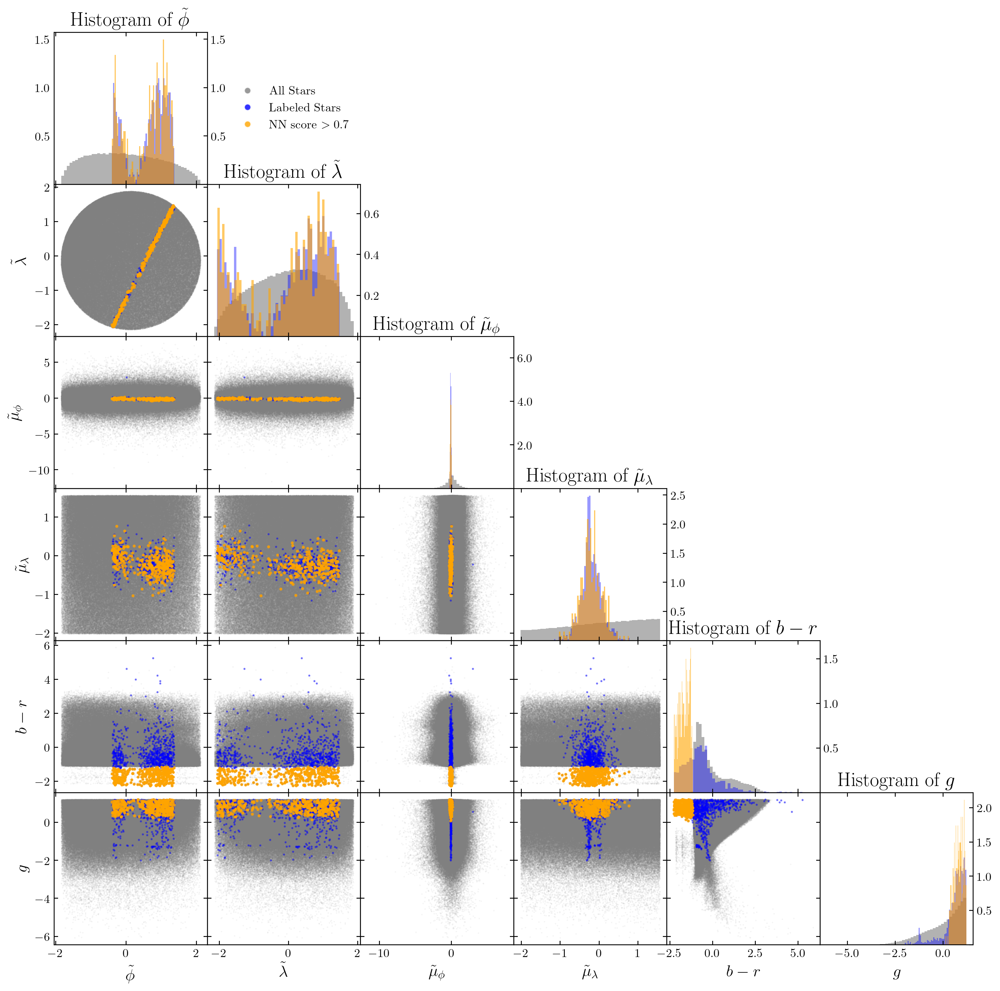

In [20]:
# Stadardaize data
scaler = StandardScaler()
standardized_design = scaler.fit_transform(class_df[interest_vars])
vars=[r'$\tilde{\phi}$', r'$\tilde{\lambda}$', r'$\tilde{\mu}_\phi$', r'$\tilde{\mu}_\lambda$', r'$b-r$', r'$g$']
corner_plots(standardized_design, vars, nn_score_inds, stream_inds)


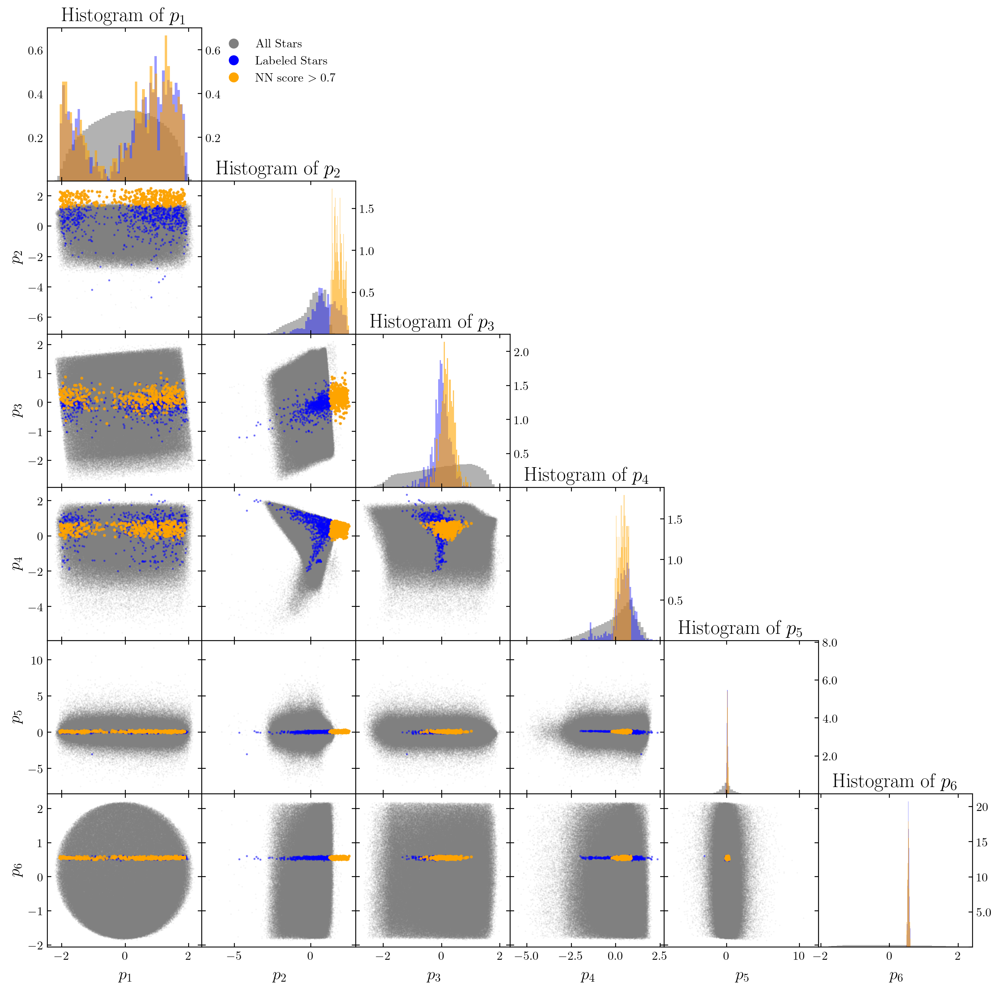

In [18]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]


vars=['$p_1$', '$p_2$', '$p_3$', '$p_4$', '$p_5$', '$p_6$']
corner_plots(standardized_design @ sorted_eigenvectors_nn, vars, nn_score_inds, stream_inds)



In [22]:
sum(i for i in [1,2,3])

6

# Centering around the stream

### Simplified 2D example

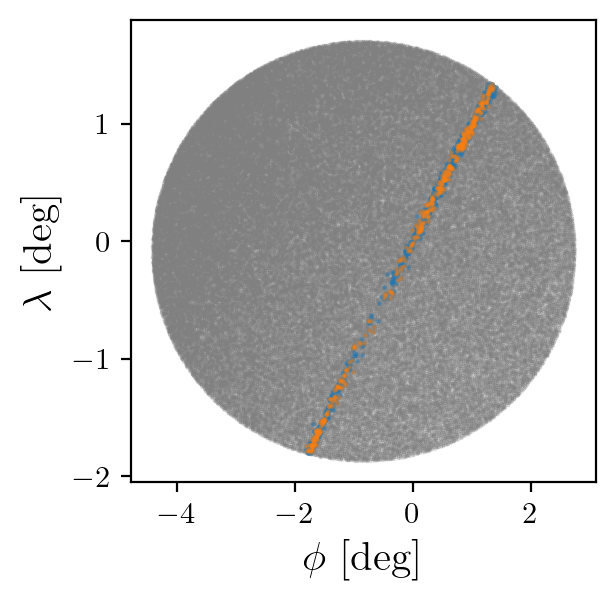

In [32]:
# Stadardaize data
scaler = StandardScaler()
scaler.fit_transform(class_df[intuitive_vars][nn_score_inds])
standardized_design = scaler.transform(class_df[intuitive_vars])

# Plot labeled vs ground truth
plt.figure(figsize=(3,3))
plt.scatter(*standardized_design.T,c='gray',alpha=0.2,s=0.03)
plt.scatter(*standardized_design[stream_inds].T,alpha=0.4,s=0.6)
plt.scatter(*standardized_design[nn_score_inds].T,alpha=0.4,s=0.6)
plt.xlabel('$\phi$ [deg]')
plt.ylabel('$\lambda$ [deg]')
plt.show()

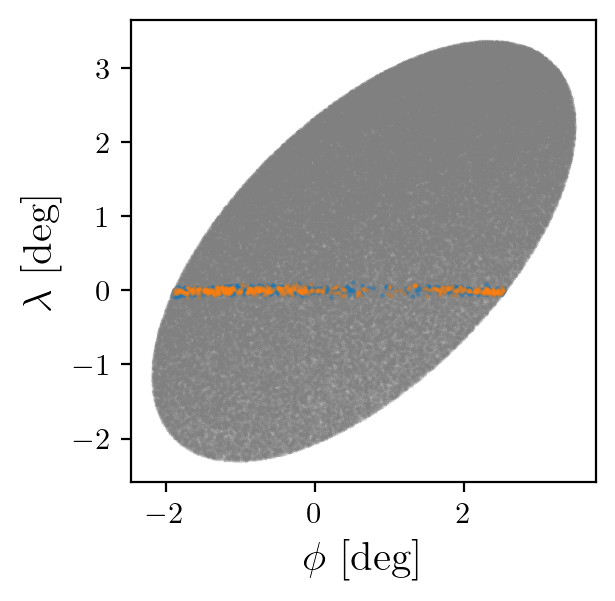

In [33]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]


plt.figure(figsize=(3,3))
plt.scatter(*sorted_eigenvectors_nn @ standardized_design.T,c='gray',alpha=0.2,s=0.03)
plt.scatter(*sorted_eigenvectors_nn @ standardized_design[stream_inds].T,alpha=0.4,s=0.6)
plt.scatter(*sorted_eigenvectors_nn @ standardized_design[nn_score_inds].T,alpha=0.4,s=0.6)
plt.xlabel('$\phi$ [deg]')
plt.ylabel('$\lambda$ [deg]')
plt.show()

### 3D Case

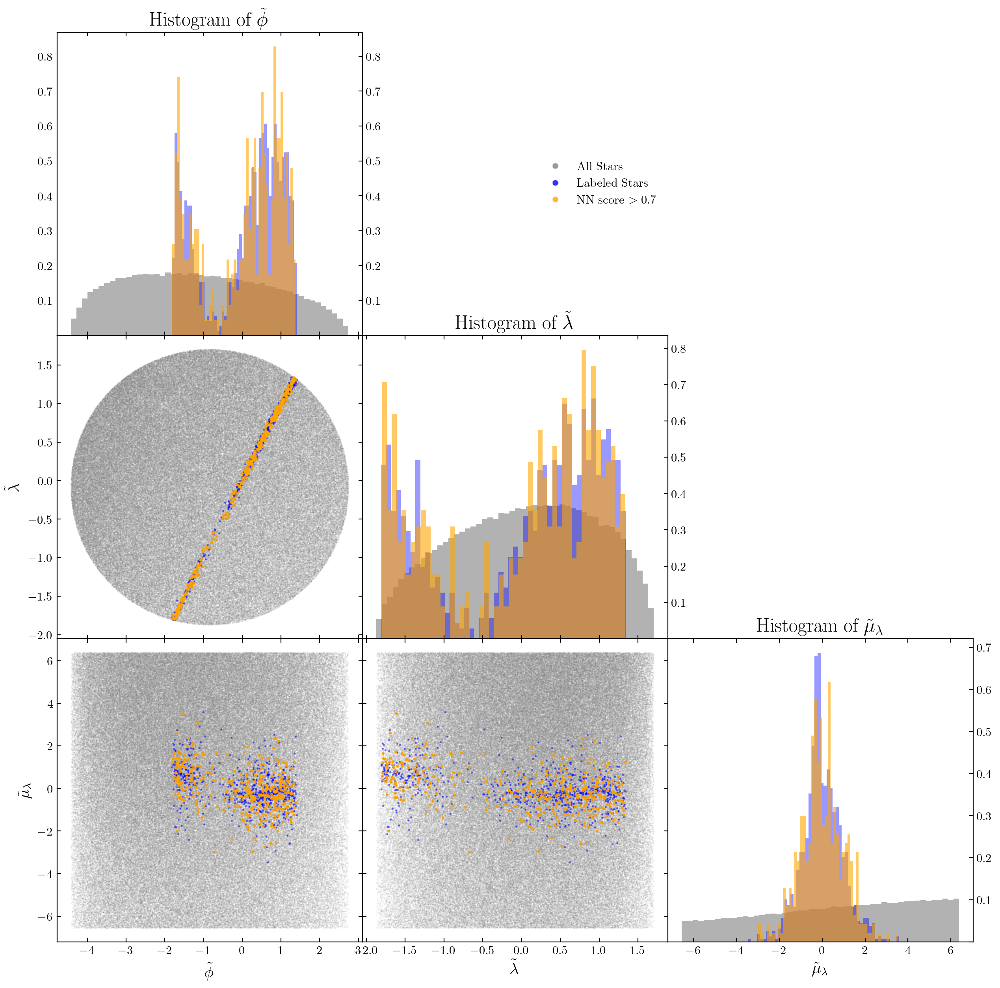

In [34]:
# Stadardaize data
scaler = StandardScaler()
scaler.fit_transform(class_df[toy_vars][nn_score_inds])
standardized_design = scaler.transform(class_df[toy_vars])

vars=[r'$\tilde{\phi}$', r'$\tilde{\lambda}$', r'$\tilde{\mu}_\lambda$']
corner_plots(standardized_design, vars, nn_score_inds, stream_inds)

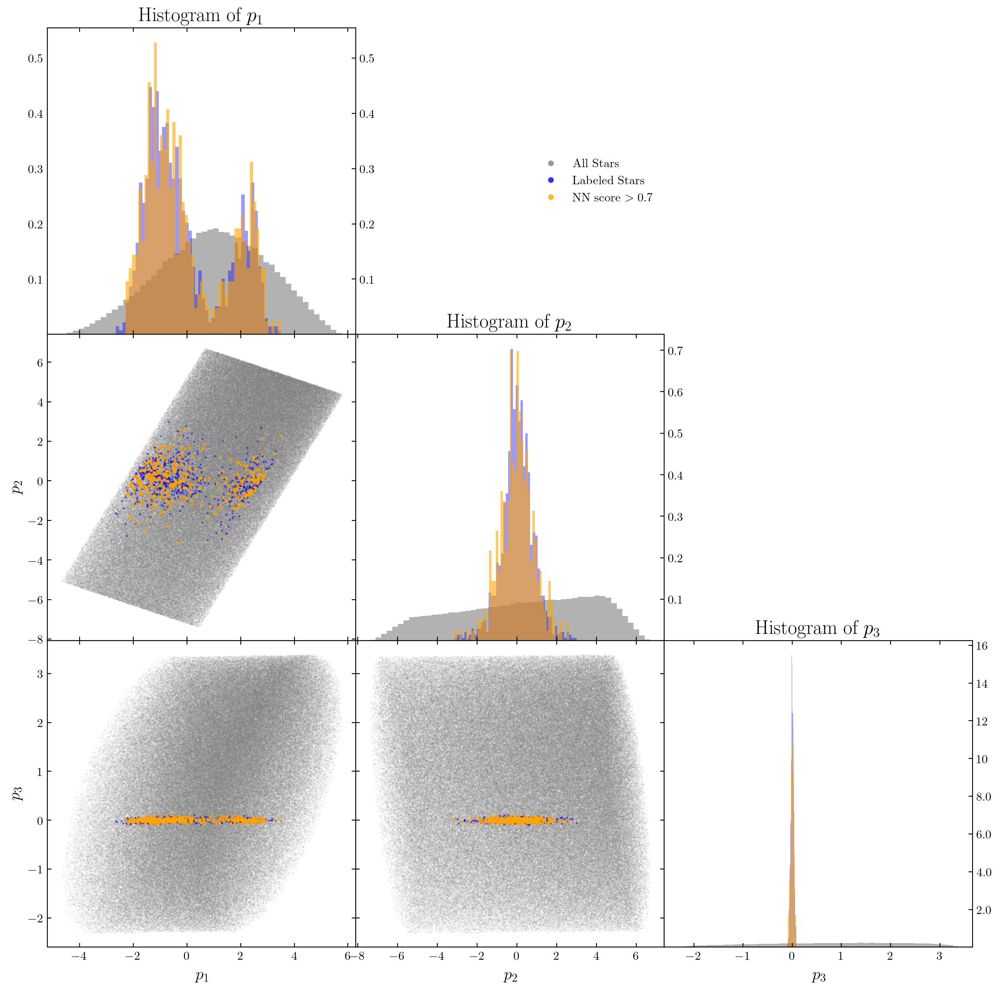

In [35]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]

vars=['$p_1$', '$p_2$', '$p_3$']
corner_plots(standardized_design @ sorted_eigenvectors_nn, vars, nn_score_inds, stream_inds)


### Full 6D

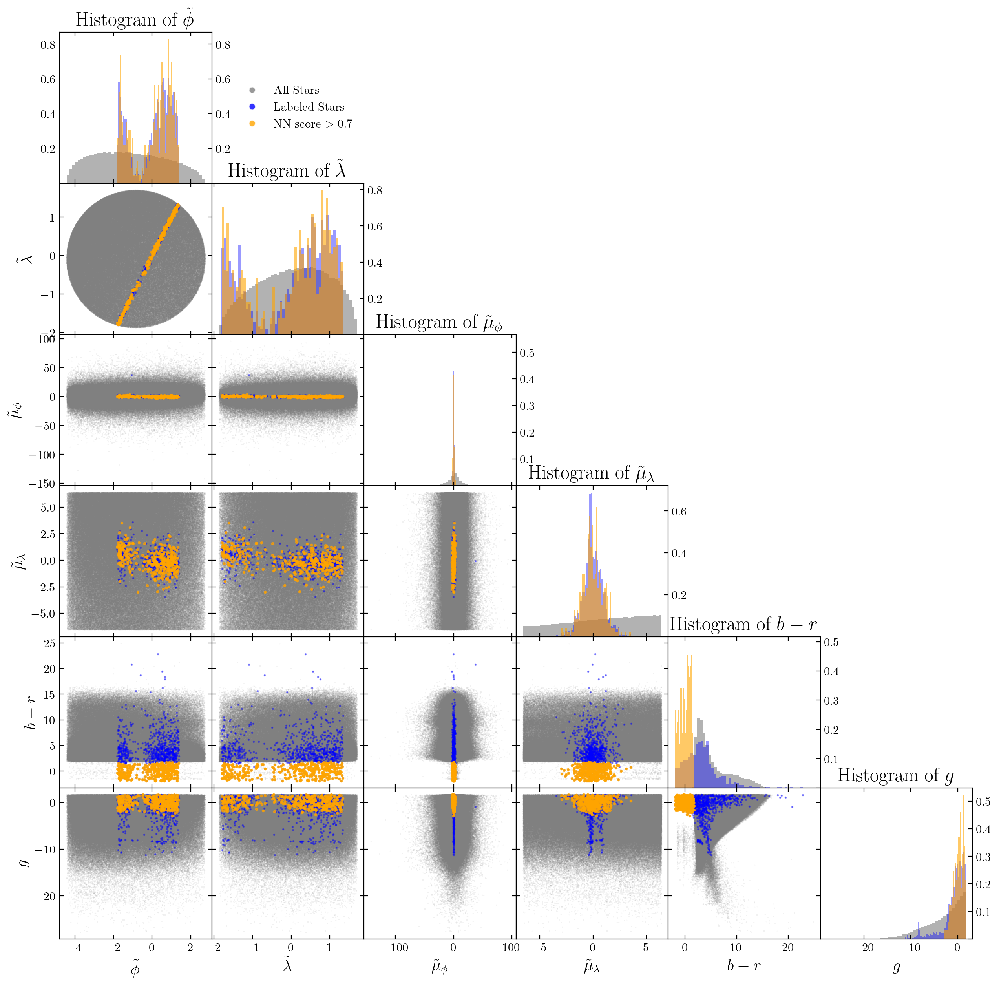

In [36]:
# Stadardaize data
scaler = StandardScaler()
scaler.fit(class_df[interest_vars][nn_score_inds])
standardized_design = scaler.transform(class_df[interest_vars])
vars=[r'$\tilde{\phi}$', r'$\tilde{\lambda}$', r'$\tilde{\mu}_\phi$', r'$\tilde{\mu}_\lambda$', r'$b-r$', r'$g$']
corner_plots(standardized_design, vars, nn_score_inds, stream_inds)


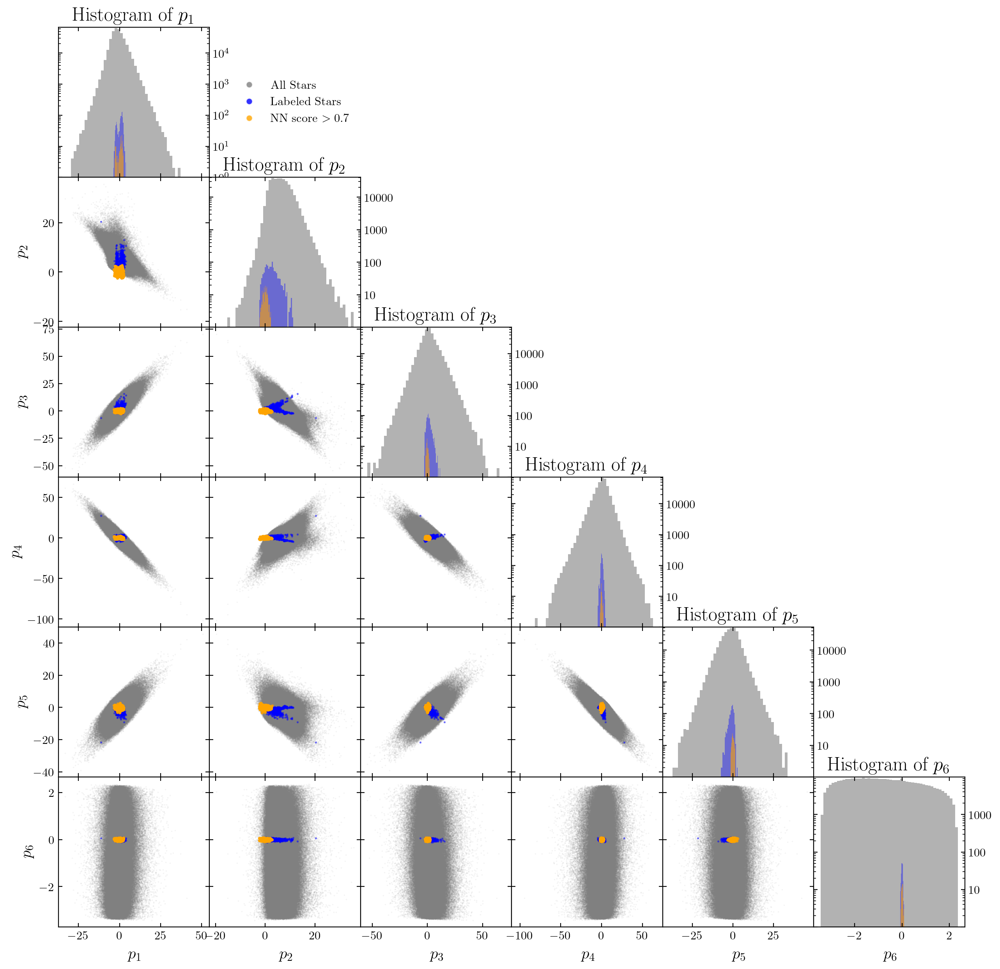

In [67]:
# Find covariance and eigenvalues.
standardized_design_nn=standardized_design[nn_score_inds]
design_nn_cov=np.cov(standardized_design_nn.T)
eigenvalues_nn, eigenvectors_nn = np.linalg.eig(design_nn_cov)
sorted_indices_nn = np.argsort(eigenvalues_nn)[::-1]

# Sort the eigenvalues and eigenvectors, the eigen vectors matrix is the matrix rotating to the new coordinate system.
sorted_eigenvalues_nn = eigenvalues_nn[sorted_indices_nn]
sorted_eigenvectors_nn = eigenvectors_nn[:, sorted_indices_nn]


vars=['$p_1$', '$p_2$', '$p_3$', '$p_4$', '$p_5$', '$p_6$']
corner_plots(standardized_design @ sorted_eigenvectors_nn, vars, nn_score_inds, stream_inds, density=False)



# Doing the analysis on a new parameter

In [75]:
# Original data
df = pd.read_hdf("../gaia_data/gd1_1_patch.h5")

Scanning over p6
Sideband region: [-2.6,-2.1) & (-1.3,-0.9]
Signal region: [-2.1,-1.3]
Total counts: SR = 174,790, SB = 166,248
Signal region has 496 stream and 174,294 bkg events (0.28%).
Sideband region has 23 stream and 166,225 bkg events (0.01%).
f_sig = 20.6X f_sideband.


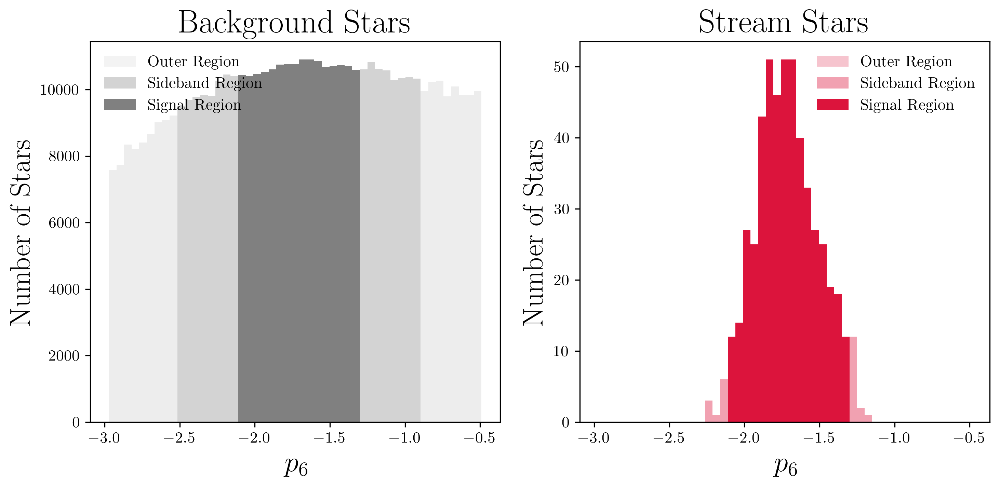

In [105]:
# Print all variables in a data frame 'df
pc_vars = ['p1', 'p2', 'p3', 'p4', 'p5', 'p6']
df_rot=df.copy()
df_rot.drop(columns=interest_vars, inplace=True)

new_vars=scaler.transform(df[interest_vars] )
new_vars=new_vars @ sorted_eigenvectors_nn
new_vars_df = pd.DataFrame(new_vars, columns=pc_vars)

new_vars_df.columns=pc_vars
df_rot = pd.concat([df_rot, new_vars_df], axis=1)

### Divide into signal & sideband regions
processor = SignalSideband(df_rot,variable='p6', var_name='$p_6$',sr_factor=2, sb_factor=4,process=True)
df_slice = processor.df_slice
processor.plot_sb_data()

In [ ]:
standardized_design @ sorted_eigenvectors_nn